# Data from Pilar and Tim
## Astrocyte cells
Three timepoints:
* Pre-symptomatic (‘early’)
* Advanced-disease (‘late’)
* Hypoxia-rescued (‘recovery’)

At each timepoint, and within each cluster (especially the highly intermixed ones), compare KO and WT. Hope is that my method can find: 
- A subset of the KO cells that in the pre-symptomatic condition shows early indication of being affected by the disease, i.e. early indication on disease vulnerability, and the rest of the KO cells are indistinguishable from WT
- In advanced-disease condition only a subset of the KO cells are affected by the disease, and some KO cells  are ‘healthy’ background indistinguishable from WT
- In the hypoxia-rescued condition some KO cells have not fully returned to normal (i.e. WT-like)


In [1]:
# external dependencies
import os
import sys
notebook_path = os.path.abspath('.')
sources_path = os.path.abspath(os.path.join(notebook_path, '..'))
sys.path.insert(0, sources_path)
# import custom modules
import utils
import models
import dataloaders

# basic imports
import json
import pprint
import pickle
import logging
from tqdm.auto import tqdm, trange

# scientific python
import matplotlib.pylab as plt
import seaborn as sns
import numpy as np
import scipy as sp
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from scipy.stats import describe as describe_stats
RAND_SEED = 28
np.random.seed(RAND_SEED)

# Scanpy modules
import scanpy as sc
import anndata

logger = logging.getLogger()
utils.matplotlib_settings()
utils.print_module_versions([sc, anndata])

from sklearn.cluster import KMeans

scanpy    : 1.6.0
anndata   : 0.7.4


## Load the hdf5 data

In [107]:
# save np.load
np_load_old = np.load
# modify the default parameters of np.load
np.load = lambda *a,**k: np_load_old(*a, allow_pickle=True, **k)

In [233]:
CELL_TYPE = 'astrocyte'
dirname = f'/home/jupyter/ViziBead/data/PilarTim_{CELL_TYPE}'
#adata = sc.read(os.path.join(dirname, f'{CELL_TYPE}_all.anndata.viz.h5ad'))
adata = sc.read(os.path.join(dirname, f'{CELL_TYPE}_all.scaling-by-sample.anndata.viz.h5ad'))

Only considering the two last: ['.viz', '.h5ad'].
Only considering the two last: ['.viz', '.h5ad'].


In [234]:
#adata
#adata.obs['timepoint']
#adata.obs['cell_subtype']
#adata.obs['KO']

In [235]:
## Beware potential batch effectss from sample_name
#adata.obs['sample_name']

# Subset desired data for analysis

In [236]:
TIMEPOINT = 'recovery'#'early'#'late'#'recovery'
SUBTYPE = 'astocyte_homeostatic_1'
#'astrocyte_homeostatic_2'#'astocyte_homeostatic_1'#'astrocyte_reactive_1'#'astrocyte_reactive_2'#'mixed_astrocyte_oligodendrocyte'

In [237]:
adata = adata[adata.obs['timepoint']==TIMEPOINT]
adata = adata[adata.obs['cell_subtype']==SUBTYPE]

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [238]:
sc.pp.filter_genes(adata, min_cells=1, inplace=True)
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack', n_comps=50)

Trying to set attribute `.var` of view, copying.


In [239]:
adata

AnnData object with n_obs × n_vars = 4083 × 25125
    obs: 'is_whitelist', 'sample_leiden', 'sample_name', 'nUMI', 'nGene', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'timepoint', 'KO', 'cerebellum', 'orig_index', 'sname_VM10', 'sname_VM11', 'sname_VM14', 'sname_VM15', 'sname_VM16', 'sname_VM17', 'sname_VM18', 'sname_VM19', 'sname_VM2', 'sname_VM21', 'sname_VM22', 'sname_VM23', 'sname_VM3', 'sname_VM5', 'sname_VM6', 'sname_VM8', 'sname_VM9', 'cell_subtype', 'cell_type'
    var: 'common_name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'unique_common_name', 'n_cells'
    uns: 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_name_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

# DE on global (original) labels of KO vs WT

In [240]:
adata.obs['KO'] = adata.obs['KO'].astype('str')

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'KO' as categorical
/opt/conda/envs/vizi/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:407: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


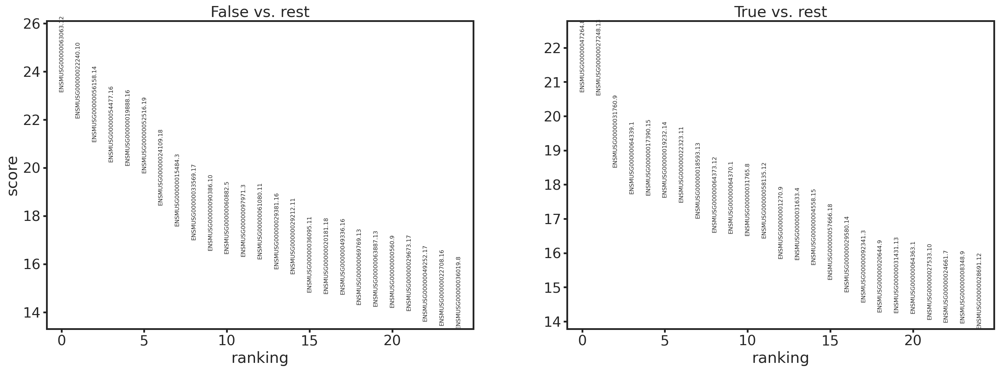

In [241]:
## classic uni-variate approach, global labels
sc.tl.rank_genes_groups(adata, 'KO', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [242]:
result_glob = adata.uns['rank_genes_groups']
groups_glob = result_glob['names'].dtype.names
result_glob_df = pd.DataFrame(
    {group + '_' + key[:1]: result_glob[key][group]
    for group in groups_glob for key in ['names', 'pvals_adj', 'logfoldchanges']})
result_KO_glob_df = result_glob_df[['True_n', 'True_p', 'True_l']]
result_WT_glob_df = result_glob_df[['False_n', 'False_p', 'False_l']]
KO_glob_DEs = result_KO_glob_df.loc[result_KO_glob_df['True_p']<0.01].loc[result_KO_glob_df['True_l']>2]['True_n'].values
WT_glob_DEs = result_WT_glob_df.loc[result_WT_glob_df['False_p']<0.01].loc[result_WT_glob_df['False_l']>2]['False_n'].values
print(KO_glob_DEs.shape, WT_glob_DEs.shape, result_glob_df.shape)

(0,) (0,) (25125, 6)


In [243]:
print(KO_glob_DEs)

[]


In [244]:
print(WT_glob_DEs)

[]


In [201]:
sc.pl.violin(adata=adata, keys=KO_glob_DEs, groupby='KO', palette=["#D95F02", "#1B9E77"], 
             save=f'_{TIMEPOINT}_{SUBTYPE}_de_KO_label_KO.png')
sc.pl.violin(adata=adata, keys=WT_glob_DEs, groupby='KO', palette=["#D95F02", "#1B9E77"], 
             save=f'_{TIMEPOINT}_{SUBTYPE}_de_WT_label_KO.png')

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


ZeroDivisionError: float division by zero

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


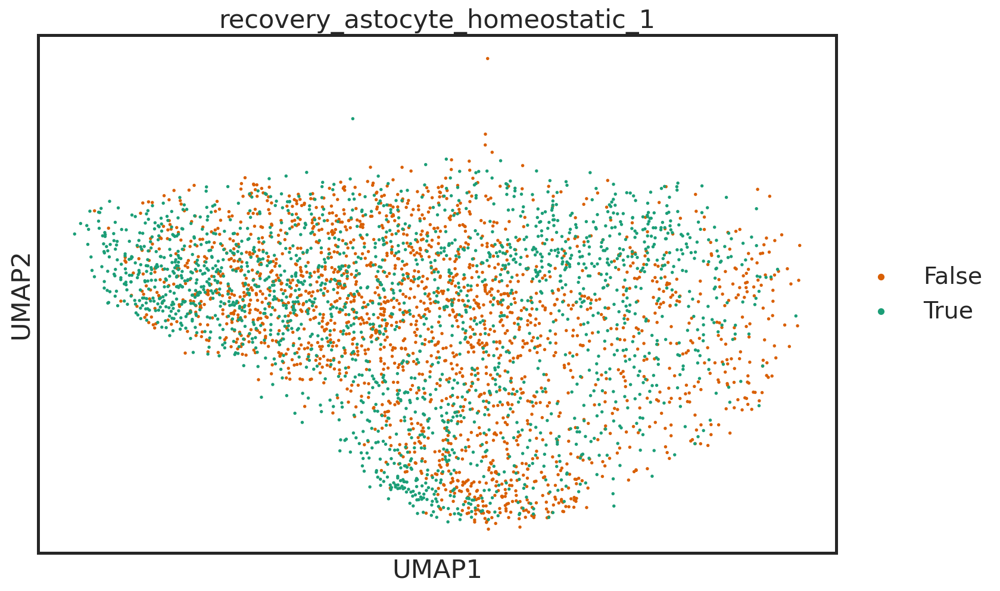

In [245]:
sc.pl.umap(adata, color='KO', palette=["#D95F02", "#1B9E77"], title=f'{TIMEPOINT}_{SUBTYPE}', 
           save=f'_{TIMEPOINT}_{SUBTYPE}_umap_label_KO.png')

In [246]:
adata.obs['tmp'] = adata.obs['sample_name'].astype('str')

... storing 'tmp' as categorical
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument 

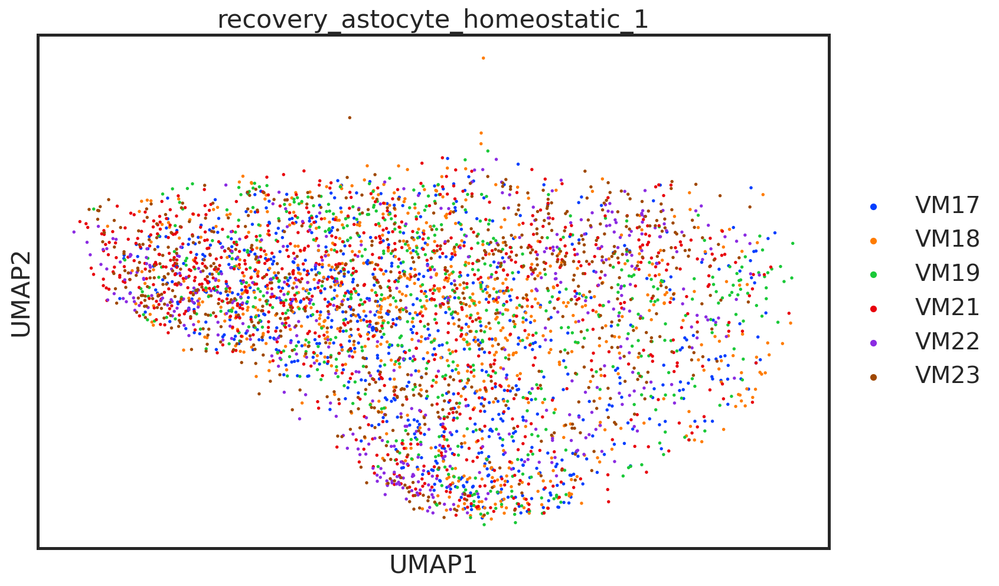

In [247]:
sc.pl.umap(adata, color='tmp', title=f'{TIMEPOINT}_{SUBTYPE}',
          save=f'_{TIMEPOINT}_{SUBTYPE}_umap_sample_name.png')

## Utility functions

In [248]:
output_path = f'{dirname}/{TIMEPOINT}_{SUBTYPE}/'
if not os.path.exists(output_path):
    os.mkdir(output_path)

In [249]:
def standalone_logistic(X, y):
    clf = LogisticRegression(random_state=RAND_SEED, penalty='none').fit(X, y)
    predicted_label = clf.predict(X)
    predicted_prob = clf.predict_proba(X)
    return predicted_prob[:,1]

def pca_logistic_kmeans(adata, num_pcs, TIMEPOINT=TIMEPOINT, SUBTYPE=SUBTYPE):
    
    p_hat = standalone_logistic(adata.obsm['X_pca'][:, 0:num_pcs], adata.obs['KO'])
    df_p_hat = pd.DataFrame()
    df_p_hat['p_hat'] = p_hat
    df_p_hat['KO'] = adata.obs['KO'].values
    adata.obs['p_hat'] = p_hat

    kmeans_KO = KMeans(n_clusters=2, random_state=0).fit(pd.DataFrame(p_hat)[(adata.obs['KO']=='True').values])
    kmeans_WT = KMeans(n_clusters=2, random_state=0).fit(pd.DataFrame(p_hat)[(adata.obs['KO']=='False').values])

    df_p_hat_clust_KO = df_p_hat.copy()
    df_p_hat_clust_KO['kmeans'] = 'WT'
    zero_lab_has_lower_mean = np.mean(p_hat[(adata.obs['KO']=='True').values][kmeans_KO.labels_==0]) < np.mean(p_hat[(adata.obs['KO']=='True').values][kmeans_KO.labels_==1])
    
    if np.mean(p_hat[(adata.obs['KO']=='True').values]) < np.mean(p_hat[(adata.obs['KO']=='False').values]): 
        # then label KO as 0 and, when you cluster the KO
        # low p_hat for the KO should get mapped onto 0 ('KO'); high p_hat for the KO should get mapped onto 1 ('WT'-like)
        df_p_hat_clust_KO['kmeans'][(adata.obs['KO']=='True').values] = ['WT' if x==int(zero_lab_has_lower_mean) else 'KO' for x in kmeans_KO.labels_] 
    else:
        # avg p_hat for KO is greater than avg p_hat for WT; then label KO as 1 and, when you cluster the KO
        # low p_hat for the KO should get mapped onto 0 ('WT'-like); high p_hat for the KO should get mapped onto 1 ('KO'-specific)
        df_p_hat_clust_KO['kmeans'][(adata.obs['KO']=='True').values] = ['KO' if x==int(zero_lab_has_lower_mean) else 'WT' for x in kmeans_KO.labels_]
        
    np.save(f'{output_path}/kmeans_logistic_pca{num_pcs}_cluster_KO.npy', df_p_hat_clust_KO['kmeans'].values)
    print('done!') 

    adata.obs['p_hat_clust_KO'] = df_p_hat_clust_KO['kmeans'].values

    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 8))
    sns.histplot(x=p_hat, hue='KO', palette={'False':"#1B9E77", 'True':"#D95F02"}, data=df_p_hat, ax=ax1)
    ax1.set_title(f'p_hat, all cells, {num_pcs} PCs')
    ax1.set_xlim([0, 1])
    sc.pl.umap(adata, color='p_hat', show=False, ax=ax2)
    sc.pl.umap(adata, color='p_hat_clust_KO', palette=['red', 'gray'], show=False, ax=ax3)
    plt.savefig(f'figures/{TIMEPOINT}_{SUBTYPE}_p_hat_clust_female_pca{num_pcs}.png')
    plt.show()

<ipython-input-249-270061fb733d>:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p_hat_clust_KO['kmeans'][(adata.obs['KO']=='True').values] = ['KO' if x==int(zero_lab_has_lower_mean) else 'WT' for x in kmeans_KO.labels_]
/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'p_hat_clust_KO' as categorical


done!


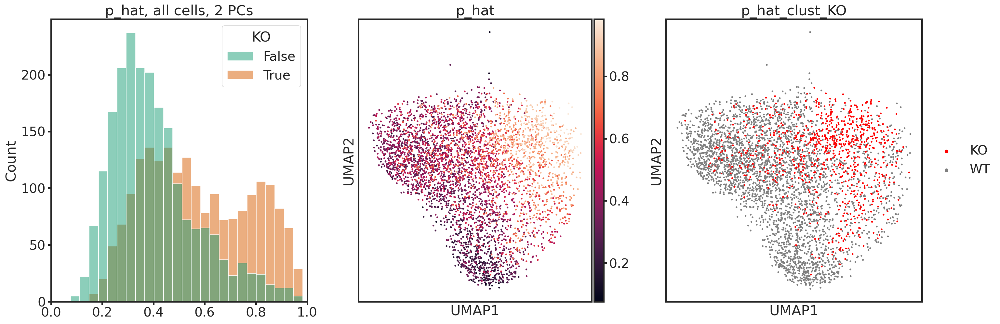

<ipython-input-249-270061fb733d>:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p_hat_clust_KO['kmeans'][(adata.obs['KO']=='True').values] = ['KO' if x==int(zero_lab_has_lower_mean) else 'WT' for x in kmeans_KO.labels_]
/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'p_hat_clust_KO' as categorical


done!


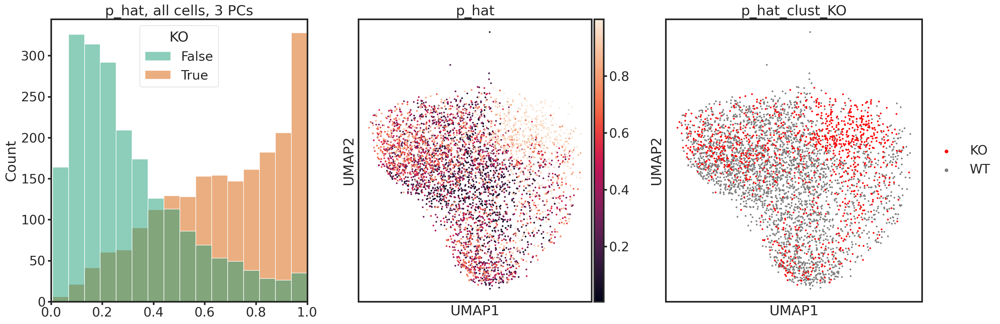

<ipython-input-249-270061fb733d>:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p_hat_clust_KO['kmeans'][(adata.obs['KO']=='True').values] = ['KO' if x==int(zero_lab_has_lower_mean) else 'WT' for x in kmeans_KO.labels_]
/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'p_hat_clust_KO' as categorical


done!


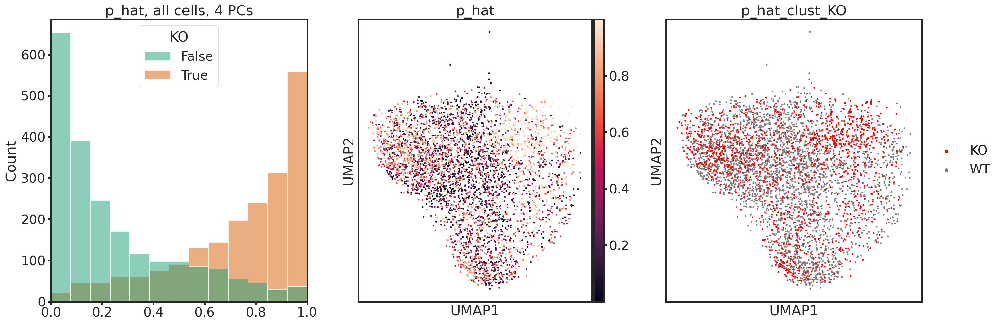

<ipython-input-249-270061fb733d>:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p_hat_clust_KO['kmeans'][(adata.obs['KO']=='True').values] = ['KO' if x==int(zero_lab_has_lower_mean) else 'WT' for x in kmeans_KO.labels_]
/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'p_hat_clust_KO' as categorical


done!


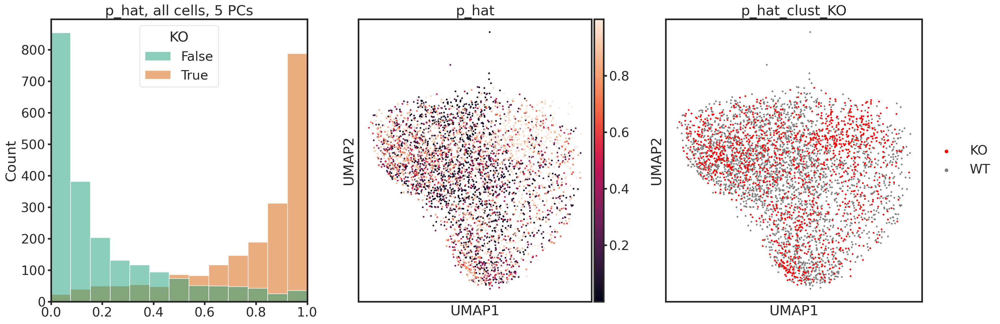

In [250]:
for num_pcs in range(2, 6):
    pca_logistic_kmeans(adata, num_pcs)

# Compare the two subsets of KO

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
Trying to set attribute `.uns` of view, copying.
/opt/conda/envs/vizi/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:407: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


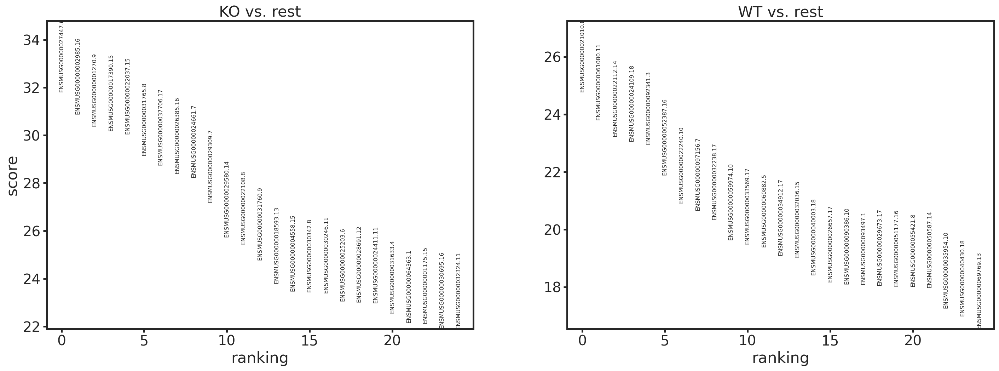

num pcs 2
(145,) (10,) (25125, 6)
['ENSMUSG00000022323.11' 'ENSMUSG00000064373.12' 'ENSMUSG00000020644.9'
 'ENSMUSG00000064337.1' 'ENSMUSG00000046447.3' 'ENSMUSG00000026473.16'
 'ENSMUSG00000031610.3' 'ENSMUSG00000020719.14' 'ENSMUSG00000025791.18'
 'ENSMUSG00000043496.7' 'ENSMUSG00000071550.14' 'ENSMUSG00000022309.9'
 'ENSMUSG00000021186.9' 'ENSMUSG00000003031.14' 'ENSMUSG00000032648.14'
 'ENSMUSG00000021417.15' 'ENSMUSG00000020415.16' 'ENSMUSG00000030088.15'
 'ENSMUSG00000037742.14' 'ENSMUSG00000030890.16' 'ENSMUSG00000022336.3'
 'ENSMUSG00000024899.7' 'ENSMUSG00000031467.10' 'ENSMUSG00000038393.14'
 'ENSMUSG00000044197.8' 'ENSMUSG00000021238.11' 'ENSMUSG00000022982.10'
 'ENSMUSG00000038855.10' 'ENSMUSG00000027624.20' 'ENSMUSG00000020108.4'
 'ENSMUSG00000020424.3' 'ENSMUSG00000045092.8' 'ENSMUSG00000067787.10'
 'ENSMUSG00000024978.11' 'ENSMUSG00000021474.9' 'ENSMUSG00000024104.11'
 'ENSMUSG00000033061.15' 'ENSMUSG00000037712.16' 'ENSMUSG00000024782.7'
 'ENSMUSG00000041889.7' 'ENSMUSG

In [280]:
num_pcs = 2
adata1 = adata[adata.obs["KO"] == "True"]

sc.tl.rank_genes_groups(adata1, f'kmeans_p_hat_{num_pcs}pcs', method='wilcoxon')
sc.pl.rank_genes_groups(adata1, n_genes=25, sharey=False)

result = adata1.uns['rank_genes_groups']
groups = result['names'].dtype.names
result_df = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges']})
result_KO_df = result_df[['KO_n', 'KO_p', 'KO_l']]
result_WT_df = result_df[['WT_n', 'WT_p', 'WT_l']]
KO_DEs = result_KO_df.loc[result_KO_df['KO_p']<0.01].loc[result_KO_df['KO_l']>2]['KO_n'].values
WT_DEs = result_WT_df.loc[result_WT_df['WT_p']<0.01].loc[result_WT_df['WT_l']>2]['WT_n'].values
print(f'num pcs {num_pcs}')
print(KO_DEs.shape, WT_DEs.shape, result_df.shape)
print(KO_DEs)
print(WT_DEs)

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


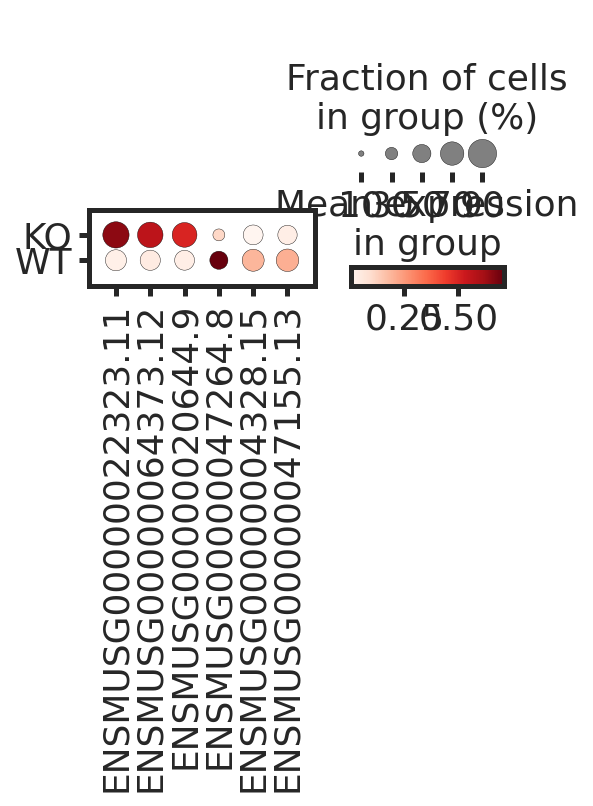

In [281]:
gene_vec=['ENSMUSG00000022323.11', 'ENSMUSG00000064373.12', 'ENSMUSG00000020644.9',
    'ENSMUSG00000047264.8', 'ENSMUSG00000004328.15', 'ENSMUSG00000047155.13']
sc.pl.dotplot(adata1, gene_vec, f'kmeans_p_hat_{num_pcs}pcs', dendrogram=False,
             save=f'top_des_{TIMEPOINT}_{SUBTYPE}_KO_subclustered_{num_pcs}pcs.png')

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/conda/envs/vizi/lib/python3.8/site-packages/seaborn/_decorators.py:36: Futur

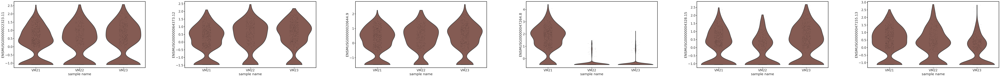

In [282]:
sc.pl.violin(adata1, gene_vec, groupby='sample_name',
             save=f'top_des_sample_name_{TIMEPOINT}_{SUBTYPE}_KO_subclustered_{num_pcs}pcs.png')

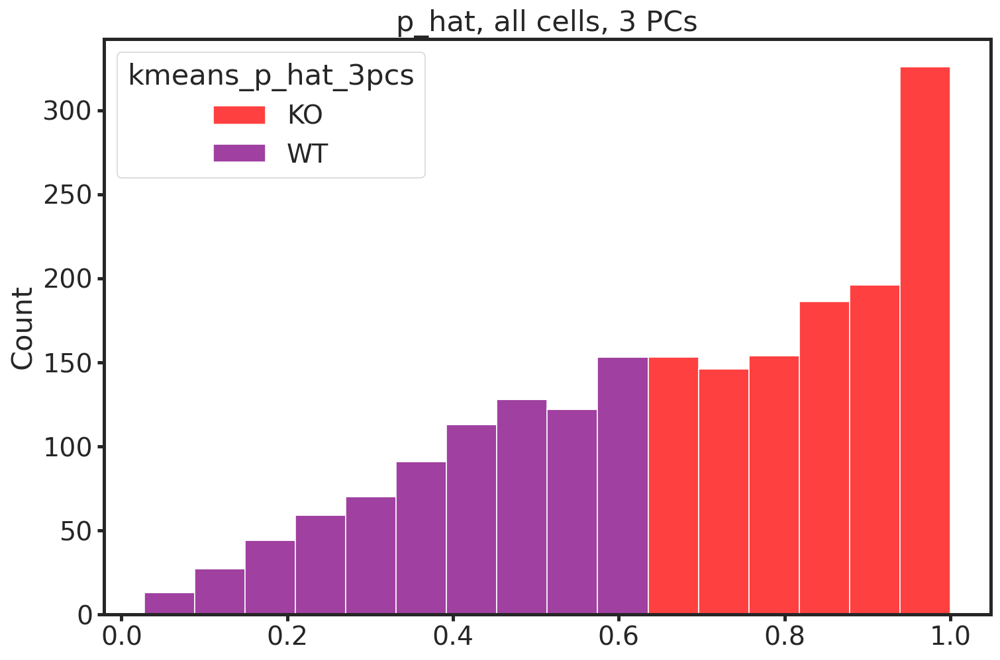

In [274]:
p_hat = standalone_logistic(adata.obsm['X_pca'][:, 0:num_pcs], adata.obs['KO'])[adata.obs["KO"] == "True"]
df_p_hat = pd.DataFrame()
df_p_hat['p_hat'] = p_hat
df_p_hat[f'kmeans_p_hat_{num_pcs}pcs'] = adata1.obs[f'kmeans_p_hat_{num_pcs}pcs'].values
sns.histplot(x=p_hat, hue=f'kmeans_p_hat_{num_pcs}pcs', 
             palette={'WT':"purple", 'KO':"red"},
             multiple="stack",
             data=df_p_hat)
plt.title(f'p_hat, all cells, {num_pcs} PCs')
plt.savefig(f'figures/hist_p_hat_{TIMEPOINT}_{SUBTYPE}_KO_subclustered_pca{num_pcs}.png')
plt.show()

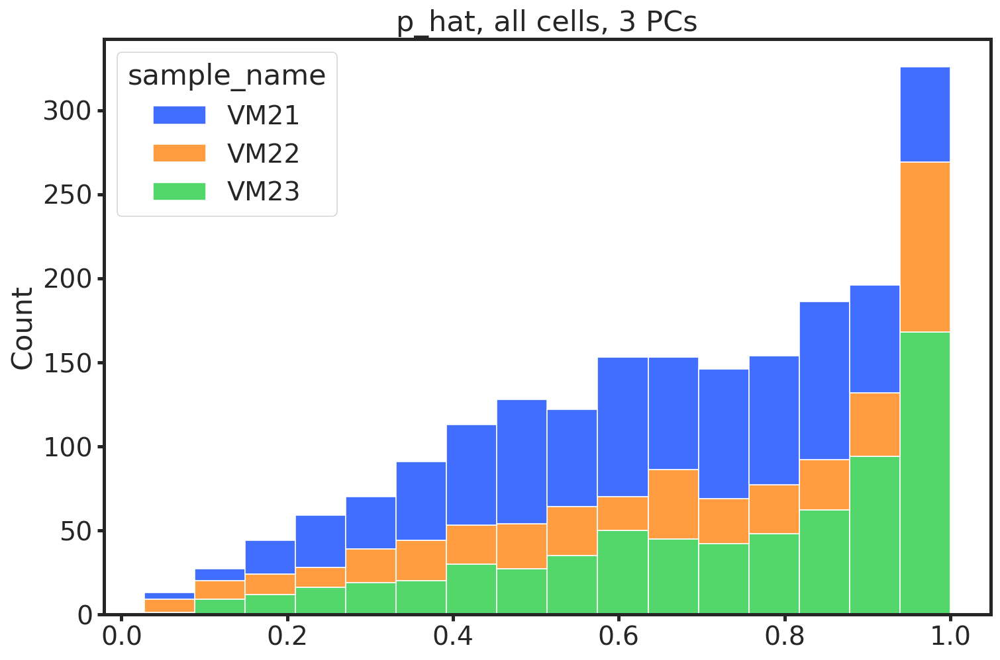

In [275]:
df_p_hat = pd.DataFrame()
df_p_hat['p_hat'] = p_hat
df_p_hat['sample_name'] = adata1.obs['sample_name'].values
sns.histplot(x=p_hat, hue='sample_name',
             multiple="stack",
             data=df_p_hat)
plt.title(f'p_hat, all cells, {num_pcs} PCs')
plt.savefig(f'figures/hist_p_hat_{TIMEPOINT}_{SUBTYPE}_sample_name_KO_pca{num_pcs}.png')
plt.show()

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


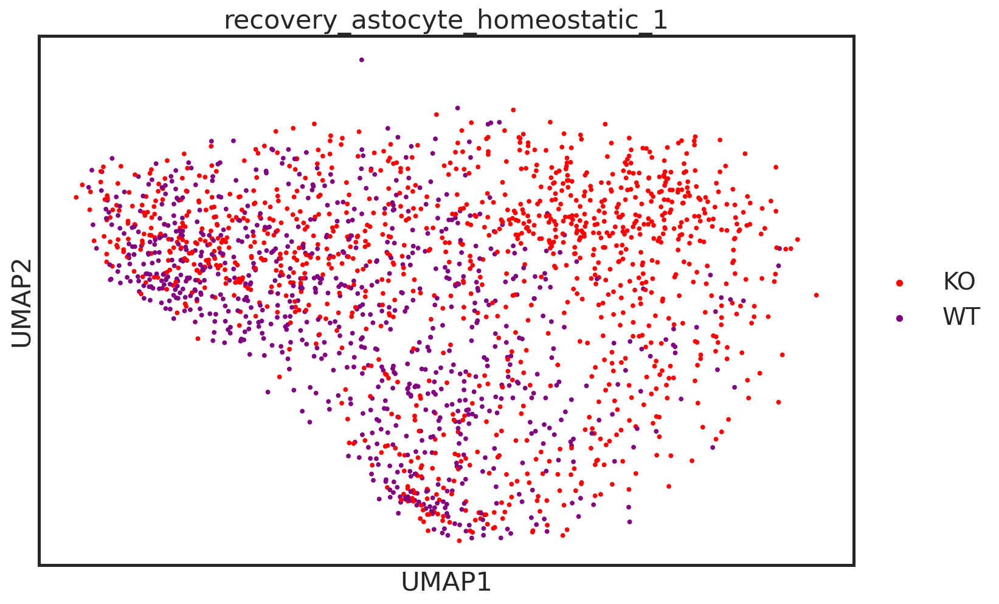

In [276]:
sc.pl.umap(adata1, color=f'kmeans_p_hat_{num_pcs}pcs', palette=["red", "purple"], title=f'{TIMEPOINT}_{SUBTYPE}',
           save=f'_{TIMEPOINT}_{SUBTYPE}_female_subclustered_{num_pcs}pcs.png')

In [251]:
## baseline0: seurat cluster all cells into two clusters
#adata.obs['baseline0'] = seurat_labs.astype('str')

## classic uni-variate approach, global labels
#sc.tl.rank_genes_groups(adata, 'baseline0', method='wilcoxon')
#sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

#result_baseline0 = adata.uns['rank_genes_groups']
#groups_baseline0 = result_glob['names'].dtype.names
#result_baseline0_df = pd.DataFrame(
#    {group + '_' + key[:1]: result_baseline0[key][group]
#    for group in groups_baseline0 for key in ['names', 'pvals_adj', 'logfoldchanges']})
#result_1_baseline0_df = result_baseline0_df[['1_n', '1_p', '1_l']]
#result_0_baseline0_df = result_baseline0_df[['0_n', '0_p', '0_l']]
#lab0_baseline0_DEs = result_0_baseline0_df.loc[result_0_baseline0_df['0_p']<0.01].loc[result_0_baseline0_df['0_l']>0.25]['0_n'].values
#lab1_baseline0_DEs = result_1_baseline0_df.loc[result_1_baseline0_df['1_p']<0.01].loc[result_1_baseline0_df['1_l']>0.25]['1_n'].values
#print(lab0_baseline0_DEs.shape, lab1_baseline0_DEs.shape, result_baseline0_df.shape)

... storing 'kmeans_p_hat_2pcs' as categorical
/opt/conda/envs/vizi/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:407: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


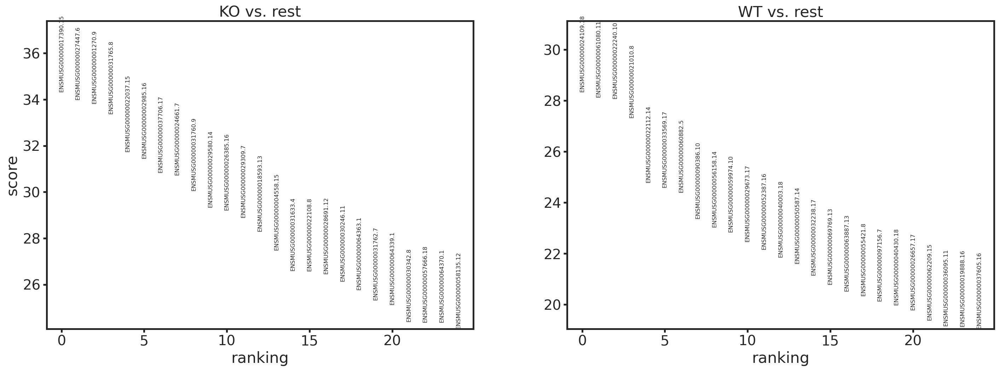

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'kmeans_p_hat_3pcs' as categorical


num pcs 2
(0,) (0,) (25125, 6)
[]
[]


/opt/conda/envs/vizi/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:407: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


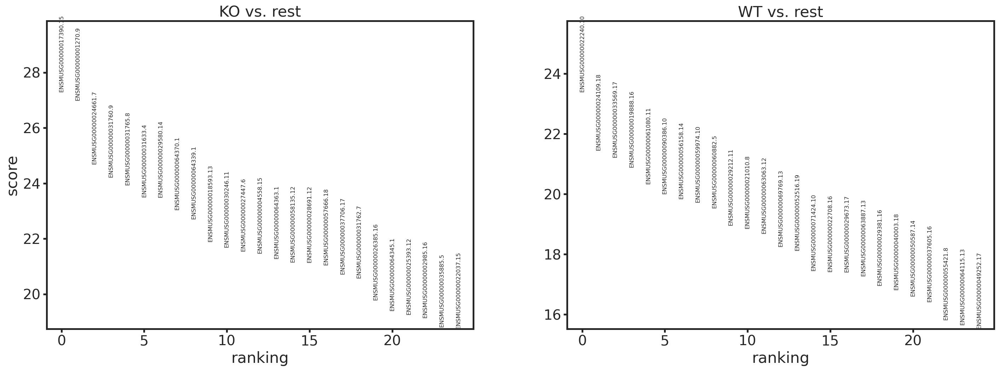

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'kmeans_p_hat_4pcs' as categorical


num pcs 3
(0,) (0,) (25125, 6)
[]
[]


/opt/conda/envs/vizi/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:407: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


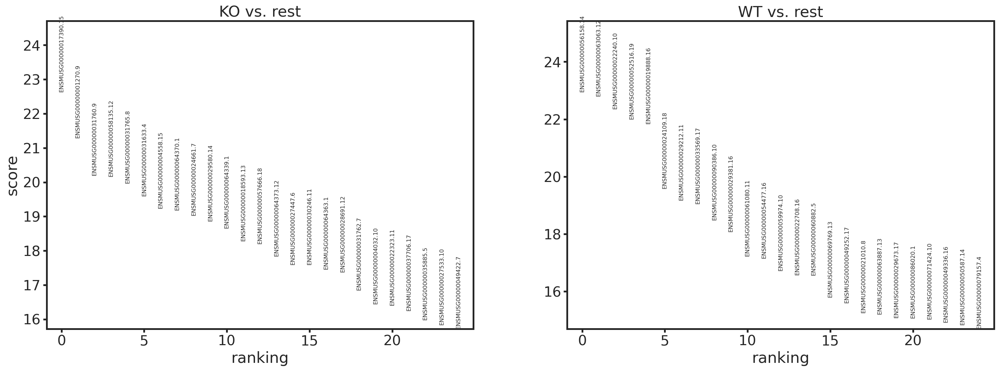

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'kmeans_p_hat_5pcs' as categorical


num pcs 4
(0,) (0,) (25125, 6)
[]
[]


/opt/conda/envs/vizi/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:407: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


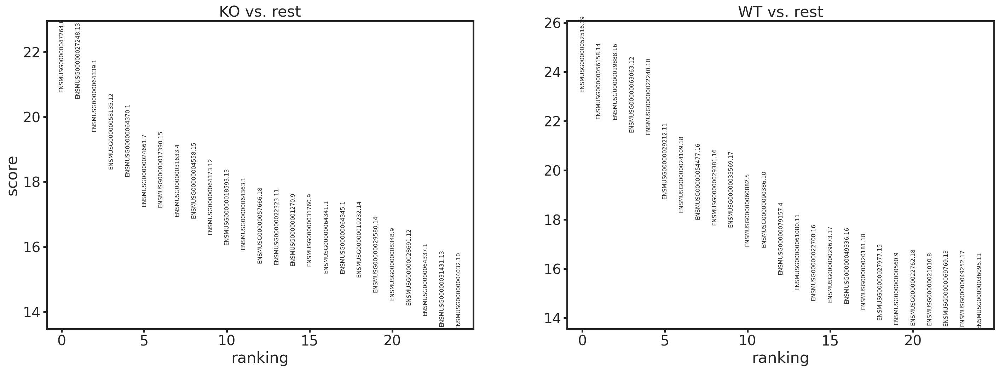

num pcs 5
(0,) (0,) (25125, 6)
[]
[]


In [252]:
for num_pcs in range(2, 6):
    labs = np.load(f'{output_path}/kmeans_logistic_pca{num_pcs}_cluster_KO.npy')
    adata.obs[f'kmeans_p_hat_{num_pcs}pcs'] = labs.astype('str')

    sc.tl.rank_genes_groups(adata, f'kmeans_p_hat_{num_pcs}pcs', method='wilcoxon')
    sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

    result = adata.uns['rank_genes_groups']
    groups = result['names'].dtype.names
    result_df = pd.DataFrame(
        {group + '_' + key[:1]: result[key][group]
        for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges']})
    result_KO_df = result_df[['KO_n', 'KO_p', 'KO_l']]
    result_WT_df = result_df[['WT_n', 'WT_p', 'WT_l']]
    KO_DEs = result_KO_df.loc[result_KO_df['KO_p']<0.01].loc[result_KO_df['KO_l']>2]['KO_n'].values
    WT_DEs = result_WT_df.loc[result_WT_df['WT_p']<0.01].loc[result_WT_df['WT_l']>2]['WT_n'].values
    print(f'num pcs {num_pcs}')
    print(KO_DEs.shape, WT_DEs.shape, result_df.shape)
    print(KO_DEs)
    print(WT_DEs)

In [ ]:
# if you find something, check for batch effects

In [ ]:
labs = np.load(f'latent_space_structure/data/{PUCK_NUMBER}/kmeans_logistic_pca.npy')

In [ ]:
labs

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'baseline1' as categorical


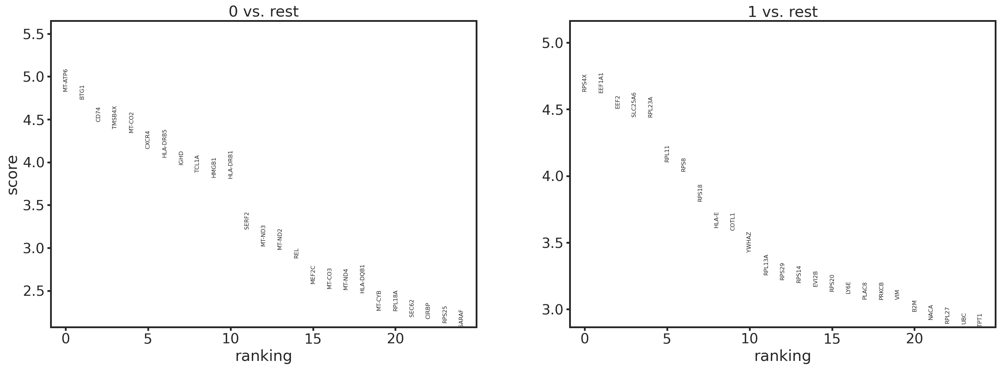

(0,) (0,) (17009, 6)


In [952]:
# baseline1: kmeans on p_hat for case from logistic on pca
labs = np.load(f'latent_space_structure/data/{PUCK_NUMBER}/kmeans_logistic_pca.npy')
adata.obs['baseline1'] = labs.astype('str')

# classic uni-variate approach, global labels
sc.tl.rank_genes_groups(adata, 'baseline1', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

result_baseline1 = adata.uns['rank_genes_groups']
groups_baseline1 = result_glob['names'].dtype.names
result_baseline1_df = pd.DataFrame(
    {group + '_' + key[:1]: result_baseline1[key][group]
    for group in groups_baseline1 for key in ['names', 'pvals_adj', 'logfoldchanges']})
result_case_baseline1_df = result_baseline1_df[['1_n', '1_p', '1_l']]
result_control_baseline1_df = result_baseline1_df[['0_n', '0_p', '0_l']]
control_baseline1_DEs = result_control_baseline1_df.loc[result_control_baseline1_df['0_p']<0.01].loc[result_control_baseline1_df['0_l']>0.25]['0_n'].values
case_baseline1_DEs = result_case_baseline1_df.loc[result_case_baseline1_df['1_p']<0.01].loc[result_case_baseline1_df['1_l']>0.25]['1_n'].values
print(control_baseline1_DEs.shape, case_baseline1_DEs.shape, result_baseline1_df.shape)

## Save DEs

In [953]:
#fname = f'latent_space_structure/data/{PUCK_NUMBER}/DE_results.npz'
#adict = {'memory_DEs':memory_DEs, 
#         'naive_DEs':naive_DEs,
#         'control_DEs':control_glob_DEs,
#         'case_DEs':case_glob_DEs,
#         'naiveB_control_DEs':naiveB_0_DEs,
#         'naiveB_case_DEs':naiveB_1_DEs}
#np.savez_compressed(fname, **adict)
##np.savez_compressed(fname, memory_DEs=memory_DEs, naive_DEs=naive_DEs)

## Save baseline0

In [954]:
fname = f'latent_space_structure/data/{PUCK_NUMBER}/DE_baseline0_results.npz'
adict = {'memory_DEs':memory_DEs, 
         'naive_DEs':naive_DEs,
         'lab0_baseline0_DEs':lab0_baseline0_DEs,
         'lab1_baseline0_DEs':lab1_baseline0_DEs}
np.savez_compressed(fname, **adict)
#adict

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


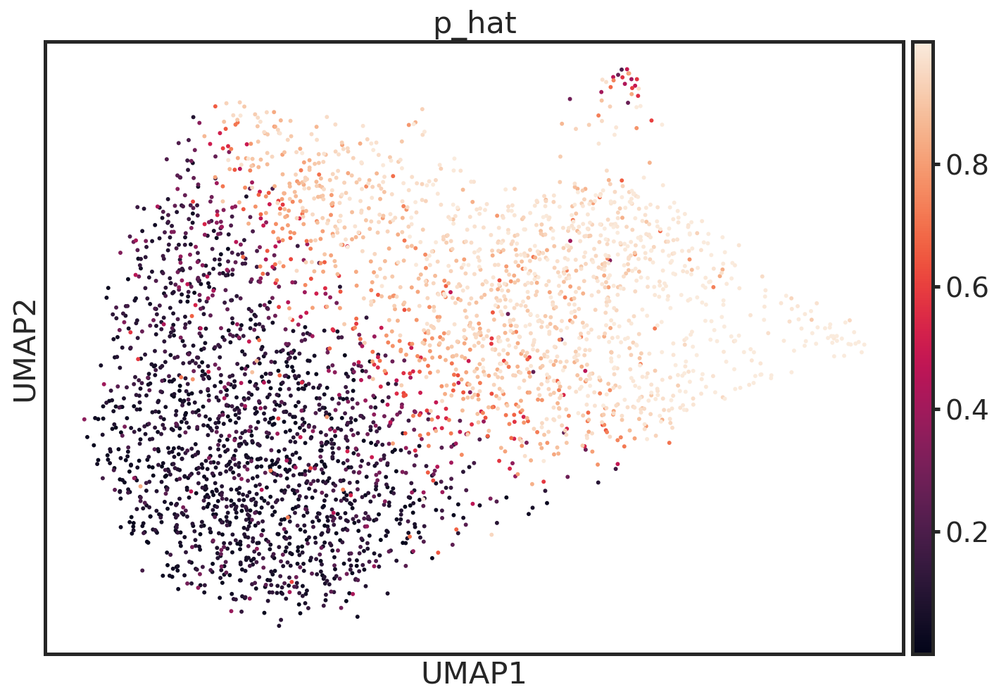

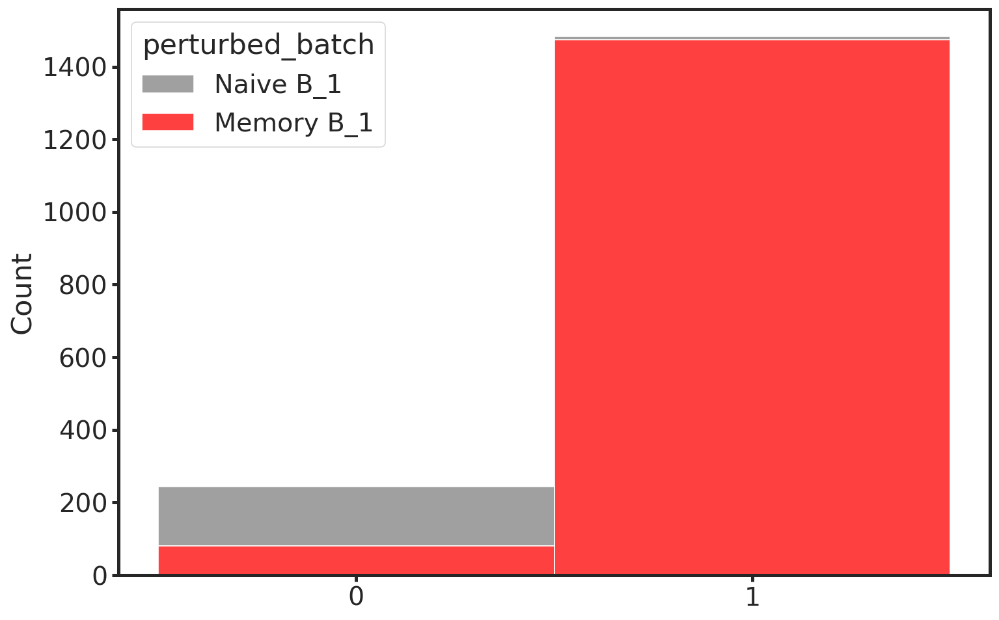

In [176]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=2, random_state=0).fit(pd.DataFrame(p_hat)[batch==1])#(df.drop(['batch', 'perturbed'], axis=1))
kmeans.labels_
#kmeans.cluster_centers_

df = pd.DataFrame()
df['batch'] = adata.obs['batch'].values.astype(int)
df['perturbed'] = adata.obs['perturbed'].values
df_kmeans = df[batch==1].copy()
df_kmeans['perturbed_batch'] = df_kmeans.apply(lambda row: f'{row["perturbed"]}_{row["batch"]}', axis=1)
df_kmeans['kmeans_labels'] = kmeans.labels_
#df_kmeans.head()
sns.histplot(x=kmeans.labels_.astype('str'), 
             hue='perturbed_batch', 
             palette=['gray', 'red'],#sns.color_palette('Dark2', 2), 
             multiple='stack', 
             data=df_kmeans)
plt.show()

In [177]:
kmeans.cluster_centers_
# can try a gaussian mixture too
# maybe LDA also?

array([[0.22663035],
       [0.9180321 ]])

<ipython-input-178-be6db1941019>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p_hat['kmeans'][batch==1] = kmeans.labels_


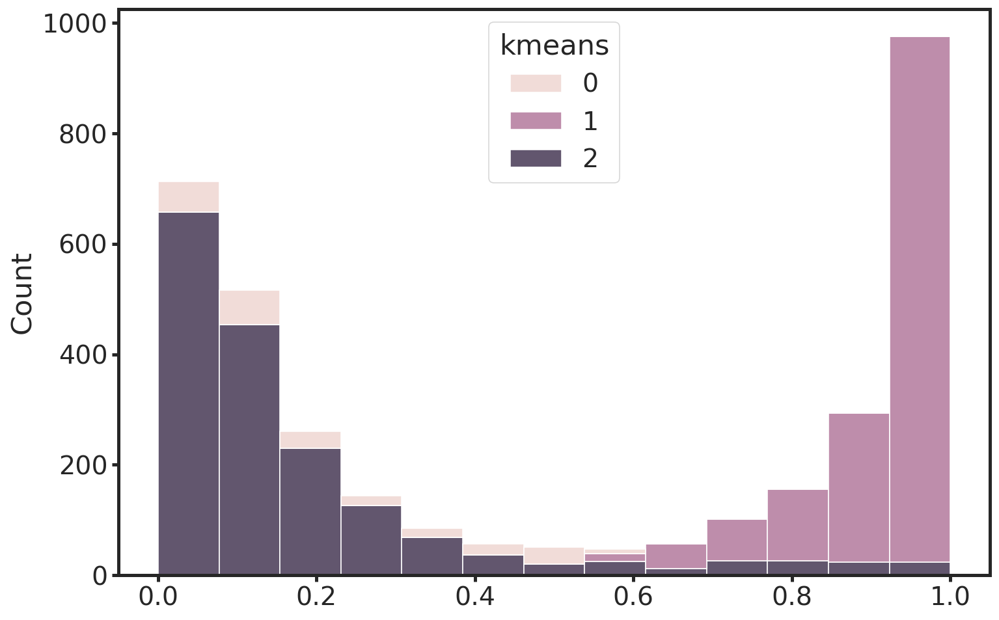

In [178]:
df_p_hat['kmeans'] = 2
df_p_hat['kmeans'][batch==1] = kmeans.labels_
sns.histplot(x=p_hat,
             hue='kmeans', 
             #palette={'Naive B':'gray','Memory B':'red'},
             data=df_p_hat,
             multiple='stack')
num_pcs = adata.obsm['X_pca'].shape[1]
#plt.title(f'Num PCs {num_pcs}')
plt.show()

/opt/conda/envs/vizi/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'kmeans_labels' as categorical
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequenc

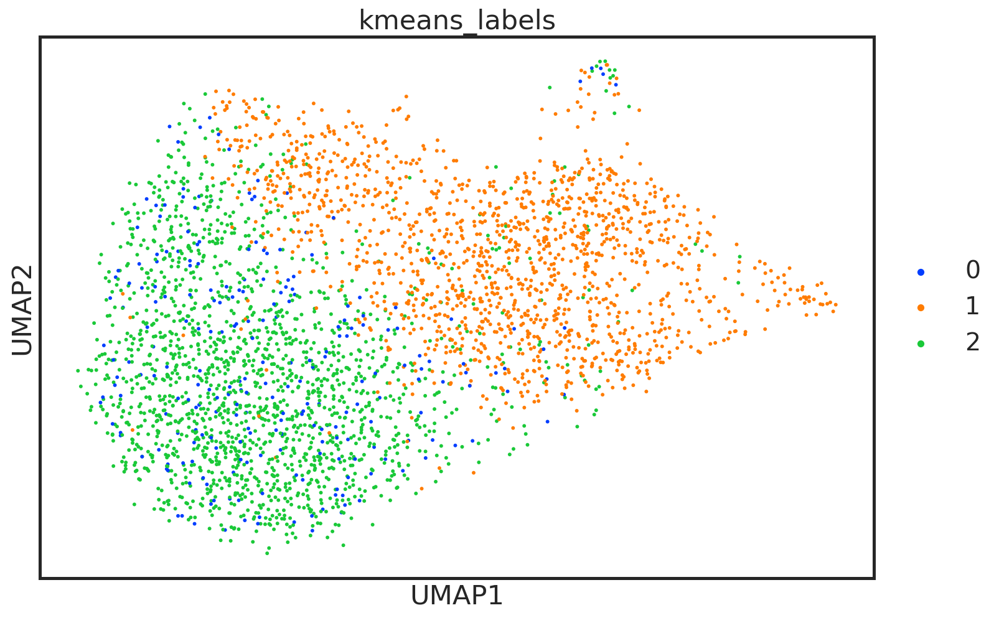

In [179]:
adata.obs['kmeans_labels'] = df_p_hat['kmeans'].values.astype('str')
sc.pl.umap(adata, color='kmeans_labels')

In [180]:
plt.scatter(tmp[batch==1], tmp[batch==1], c=kmeans.labels_==1, alpha=0.5)
# i want a two by two table, with perturbed/nnot perturbed, and kmeans label 0 and 1

IndexError: boolean index did not match indexed array along dimension 0; dimension is 2054 but corresponding boolean dimension is 3455

In [181]:
plt.scatter(tmp[batch==1], tmp[batch==1], c=perturbed[batch==1]=='Memory B', alpha=0.5)

IndexError: boolean index did not match indexed array along dimension 0; dimension is 2054 but corresponding boolean dimension is 3455